In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from itertools import combinations 

import sklearn
import sklearn.metrics as sm
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale

**We know that for KMeans clustering we need to decide the number of clusters/centroids so we take hint from the optimal no. of clusters that we got before from mean shift algorithm and try them out.**
* using different subsets of the original data
* using variations of the original segmentation attributes
* using different distance metrics
* using different segmentation methods
* using different numbers of clusters

In [19]:
df1 = pd.read_pickle("./ds1_trans.pkl")
df2 = pd.read_pickle("./ds2_trans.pkl")
# we are no currently usning the second dataset

**Need to look at the data to estimate the no. of cluster centers required but difficult to plot in multi-dimentional dataset**

In [60]:
def run_Kmeans(df, try_no_clusters):
    dfx         = scale(df)
    col_names   = df.columns
    all_comb    = list(combinations(col_names, 2))
    color_theme = np.array(['red','green','blue','yellow','black','pink','orange'])
    clustering = KMeans(n_clusters=try_no_clusters)
    clustering.fit(dfx)
    print(clustering)
    #permutate over all colummns !!!
    for i in range(len(all_comb)):
        plt.scatter(x=df[all_comb[i][0]], y=df[all_comb[i][1]], c=color_theme[clustering.labels_],s=10)
        plt.show()
    return clustering

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)


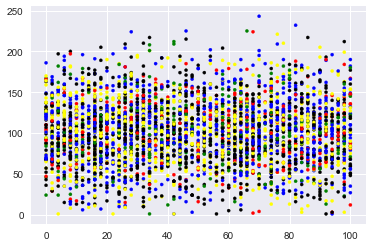

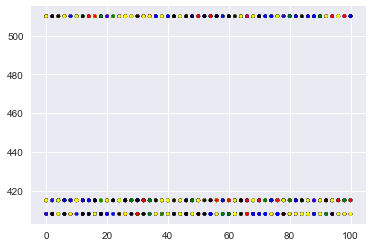

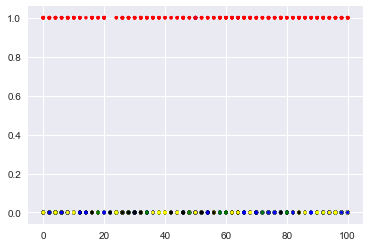

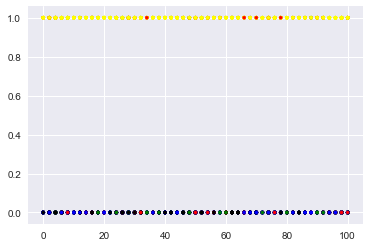

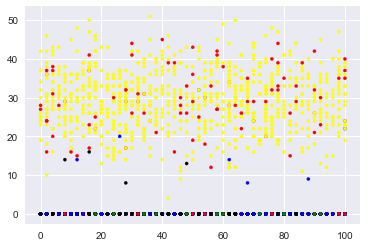

...

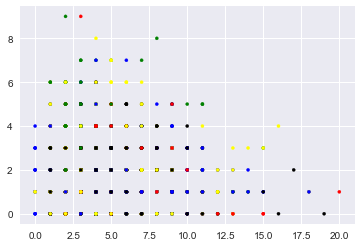

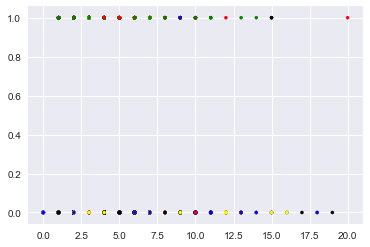

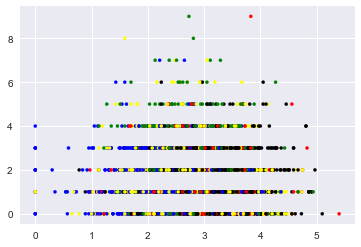

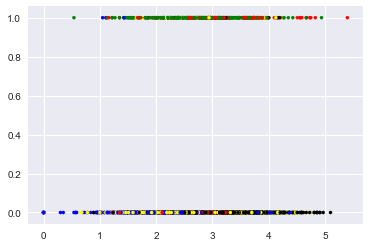

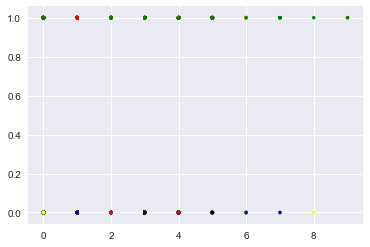

[3 3 4 ..., 2 0 3]


In [61]:
df1_5_clusters = run_Kmeans(df1,5)
print(df1_5_clusters.labels_)

In [62]:
df1['cluster'] = df1_5_clusters.labels_
df1

,state,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,...,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,cluster
phone number,,,,,,,,,,,,,,,,,,,,,
382-4657,0,128,415,0,1,25,265.1,110,45.07,197.4,...,16.78,244.7,91,11.01,10.0,3,2.70,1,0,3
371-7191,2,107,415,0,1,26,161.6,123,27.47,195.5,...,16.62,254.4,103,11.45,13.7,3,3.70,1,0,3
358-1921,4,137,415,0,0,0,243.4,114,41.38,121.2,...,10.30,162.6,104,7.32,12.2,5,3.29,0,0,4
375-9999,2,84,408,1,0,0,299.4,71,50.90,61.9,...,5.26,196.9,89,8.86,6.6,7,1.78,2,0,0
330-6626,6,75,415,1,0,0,166.7,113,28.34,148.3,...,12.61,186.9,121,8.41,10.1,3,2.73,3,0,0
391-8027,8,118,510,1,0,0,223.4,98,37.98,220.6,...,18.75,203.9,118,9.18,6.3,6,1.70,0,0,0
355-9993,10,121,510,0,1,24,218.2,88,37.09,348.5,...,29.62,212.6,118,9.57,7.5,7,2.03,3,0,3
329-9001,12,147,415,1,0,0,157.0,79,26.69,103.1,...,8.76,211.8,96,9.53,7.1,6,1.92,0,0,0
335-4719,14,117,408,0,0,0,184.5,97,31.37,351.6,...,29.89,215.8,90,9.71,8.7,4,2.35,1,0,2


In [63]:
count_labels = Counter(list(df1_5_clusters.labels_))
print(count_labels.keys())
print(count_labels.values())

dict_keys([3, 4, 0, 2, 1])
dict_values([818, 1017, 318, 912, 268])


### Now splitting the original un-scalled dataset accourding to the cluster for further analysis